# ***CODE FOR THE VIT_B_32 MODEL***

One of the models used in our research was the Vision Transformer ViT_B_16 (`google/vit-base-patch32-224-in21k`), which we took from the timm library. This model comes pre-trained on the ImageNet-21k dataset, providing a robust starting point for our fine-tuning and evaluation tasks.



In [ ]:
#! pip install transformers
#! pip install torch
#! pip install torchvision
#! pip install torch.utils
#! pip install datasets
#! pip install optuna
#! pip install fvcore

import fvcore
from fvcore.nn import FlopCountAnalysis
import torch
import timm
from transformers import ViTForImageClassification, ViTConfig, get_cosine_schedule_with_warmup
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import optuna
from torch.optim import SGD
import pandas as pd
from torchvision.transforms import ToPILImage, Normalize
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from collections import defaultdict
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### ***Customizing the Models for Fine-Tuning***

After loading the model, we adjusted the classification head an freezed all the layers except for the head.

In [ ]:
num_classes = 20

# Let's load the model
model = ViTForImageClassification.from_pretrained('google/vit-base-patch32-224-in21k', num_labels=num_classes)

#Let's have a look at the model's structure
print(model)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/352M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch32-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTSdpaAttention(
            (attention): ViTSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fe

In [ ]:
# Freeze all layers except the classification head
for param in model.parameters():
    param.requires_grad = False  # Freeze all layers

# Unfreeze the classification head
for param in model.classifier.parameters():  # Adjusted to the correct attribute
    param.requires_grad = True

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

### ***Preparing the Dataset***

After customizing the models, we also preprocessed the images to ensure compatibility. Each image was resized to (224*224) pixels to standardize the input dimensions, and the pixel values were normalized using a mean of \([0.485, 0.456, 0.406]\) and a standard deviation of \([0.229, 0.224, 0.225]\), standerd values for ImageNet pre-trained models.

In [ ]:
# Preprocessing transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

#Load datasets
train_dataset = datasets.ImageFolder("/content/drive/MyDrive/AML_Final_Project/Dataset/Subsample_20_classes_spliited/subset_only_20_train", transform=transform)
val_dataset = datasets.ImageFolder("/content/drive/MyDrive/AML_Final_Project/Dataset/Subsample_20_classes_spliited/subset_only_20_val", transform=transform)
test_dataset = datasets.ImageFolder("/content/drive/MyDrive/AML_Final_Project/Dataset/Subsample_20_classes_spliited/subset_only_20_test", transform=transform)

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)


#### ***FLOPs***

Then we computed the FLOPs (Floating Point Operations) of the models to evaluate their computational complexity and efficiency. This metric provides insight into the amount of computational effort required for a forward pass, helping us compare the performance and resource demands of different models.<br> It will be used to make an accuracy vs FLOPs graph later.

In [ ]:
for images, _ in test_loader:
    input_tensor = images.to(device)
    break

# FLOPs computation
flops = FlopCountAnalysis(model, input_tensor)
print(f"Total FLOPs for one forward pass: {flops.total()} FLOPs")

dataset_size = len(train_dataset)
num_epochs = 10
batch_size = 32

total_flops = (flops.total() * dataset_size * num_epochs) / batch_size
print(f"Total FLOPs for fine-tuning: {total_flops}")

vit.encoder.layer.0.attention.attention.dropout, vit.encoder.layer.1.attention.attention.dropout, vit.encoder.layer.10.attention.attention.dropout, vit.encoder.layer.11.attention.attention.dropout, vit.encoder.layer.2.attention.attention.dropout, vit.encoder.layer.3.attention.attention.dropout, vit.encoder.layer.4.attention.attention.dropout, vit.encoder.layer.5.attention.attention.dropout, vit.encoder.layer.6.attention.attention.dropout, vit.encoder.layer.7.attention.attention.dropout, vit.encoder.layer.8.attention.attention.dropout, vit.encoder.layer.9.attention.attention.dropout


Total FLOPs for one forward pass: 139748917248 FLOPs
Total FLOPs for fine-tuning: 104811687936000.0


### ***FINE-TUNING***

### ***Fine-tuning configurations***

We started with the hyperparameter values for fine-tuning that are detailed in the appendix of the [paper](https://arxiv.org/abs/2010.11929), Section B.1.1:

- ***Learning Rate:***  
  The learning rate is managed using a **cosine learning rate decay**, implemented in the `create_learning_rate_scheduler()` function found in `utils.py`. For our experiment, we use a base learning rate of **0.03** with cosine decay, as described in the paper.  

- ***Batch:***  
  The batch size is defined in the `common.py` file under `config.batch`. Initially, we set a batch size of **218** due to computational power and GPU memory constraints. The default batch size in the repository (`512`) can be used if memory allows.  

- ***Steps/Epochs:***  
  We fine-tune the model for **10,000 steps** or equivalent epochs depending on the batch size. This is specified in `common.py` under `config.total_steps`.  

- ***Regularization:***  
  No weight decay is applied, as specified in the paper.  

- ***Optimizer:***  
  The optimizer is defined in the `train.py` script and utilizes **SGD with momentum** (momentum = **0.9**), matching the paper's recommendations. This is configured using the `optax` library, specifically in the `tx` optimizer setup.

Though, these values were optimized for datasets like ImageNet, and given the differences between the datasets used in the research and Places365 adjustments were made to adapt to the specific characteristics and constraints of our dataset, such as size and computational resources.<br> An automatic hyperparameter tuning was performed with the `optuna library` to asses the best learning rate of the cosine learning rate decay and the momentum of the SGD optimizer.

Now we can go with the ***automatic hyperparameter tuning***:

In [ ]:
# Hyperparameters
num_epochs = 5
max_grad_norm = 1.0
loss_fn = torch.nn.CrossEntropyLoss()

# Objective function
def objective(trial):

    lr = trial.suggest_loguniform('lr', 1e-5, 1e-2)
    momentum = trial.suggest_uniform('momentum', 0.7, 0.99)

    # Optimizer
    optimizer = SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay= 0)

    # Scheduler
    num_training_steps = len(train_loader) * num_epochs
    scheduler = get_cosine_schedule_with_warmup(
        optimizer,
        num_warmup_steps=100,
        num_training_steps=num_training_steps
    )

    model.to(device)

    # Training and validation
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        total_loss = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs.logits, labels)
            loss.backward()

            # Gradient clipping
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)

            optimizer.step()
            scheduler.step()
            total_loss += loss.item()

        # Validation phase
        model.eval()
        correct = 0
        total = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.max(outputs.logits, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        validation_accuracy = 100 * correct / total

    return validation_accuracy


# Optuna study to maximize validation accuracy
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5)

print("Best trial:")
trial = study.best_trial

print(f"  Validation Accuracy: {trial.value}")
print("  Best Hyperparameters:")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

[I 2024-12-18 14:11:29,151] A new study created in memory with name: no-name-adf16a44-6a80-4548-93d9-a0e3f48918d4
C:\Users\Livia_99\AppData\Local\Temp\ipykernel_17040\3465105812.py:13: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform('lr', 1e-5, 1e-2)  # Learning rate range
C:\Users\Livia_99\AppData\Local\Temp\ipykernel_17040\3465105812.py:14: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  momentum = trial.suggest_uniform('momentum', 0.7, 0.99)  # Momentum range
[I 2024-12-18 14:28:29,086] Trial 0 finished with value: 9.375 and parameters: {'lr': 1.6076987314493138e-05, 'momentum': 0.9808349437907407}. Best is trial 0 with value: 9.375.
[I 2024-12-18 14:49:08,06

KeyboardInterrupt: 

To see all the hyperpameter combinations for the fine-tuning:

In [ ]:
print("All trials:")

trial_results = []
for trial in study.trials:
    trial_results.append({
        "Trial Number": trial.number,
        "Learning Rate (lr)": trial.params.get("lr"),
        "Momentum": trial.params.get("momentum"),
        "Weight Decay": trial.params.get("weight_decay"),
        "Validation Accuracy": trial.value
    })

results_df = pd.DataFrame(trial_results)

print(results_df)

results_df.to_csv("optuna_hyperparameter_results.csv", index=False)
print("Results saved to optuna_hyperparameter_results.csv")


All trials:


NameError: name 'study' is not defined

### ***Training***
Then, after finding the best hyperparameter values we can traing the models:

In [ ]:
num_epochs = 10
max_grad_norm = 1.0
lr = 0.009
momentum= 0.93

#Optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay=0)
loss_fn = torch.nn.CrossEntropyLoss()

#Cosine scheduler
num_training_steps = len(train_loader) * num_epochs
scheduler = get_cosine_schedule_with_warmup(
    optimizer,
    num_warmup_steps=100,
    num_training_steps=num_training_steps
)

In [ ]:
# Training loop
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    batch_accuracies = []

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        loss = loss_fn(outputs.logits, labels)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=max_grad_norm)

        optimizer.step()
        scheduler.step()

        total_loss += loss.item()

        _, predicted = torch.max(outputs.logits, 1)
        correct = (predicted == labels).sum().item()
        total = labels.size(0)
        batch_accuracy = 100 * correct / total
        batch_accuracies.append(batch_accuracy)

    avg_train_loss = total_loss / len(train_loader)
    std_train_accuracy = np.std(batch_accuracies)

    print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {avg_train_loss:.4f}, Std Dev Accuracy: {std_train_accuracy:.4f}")

    # Validation phase
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, predicted = torch.max(outputs.logits, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f"Validation Accuracy: {accuracy:.2f}%")

Epoch 1/10, Train Loss: 2.7983, Std Dev Accuracy: 29.5544
Validation Accuracy: 75.50%
Epoch 2/10, Train Loss: 1.7185, Std Dev Accuracy: 6.7500
Validation Accuracy: 80.12%
Epoch 3/10, Train Loss: 1.0251, Std Dev Accuracy: 6.6270
Validation Accuracy: 79.75%
Epoch 4/10, Train Loss: 0.8052, Std Dev Accuracy: 6.4031
Validation Accuracy: 80.75%
Epoch 5/10, Train Loss: 0.7108, Std Dev Accuracy: 5.8259
Validation Accuracy: 80.50%
Epoch 6/10, Train Loss: 0.6594, Std Dev Accuracy: 5.9576
Validation Accuracy: 80.88%
Epoch 7/10, Train Loss: 0.6303, Std Dev Accuracy: 6.6020
Validation Accuracy: 80.88%
Epoch 8/10, Train Loss: 0.6141, Std Dev Accuracy: 6.0458
Validation Accuracy: 80.88%
Epoch 9/10, Train Loss: 0.6064, Std Dev Accuracy: 6.3773
Validation Accuracy: 80.88%
Epoch 10/10, Train Loss: 0.6040, Std Dev Accuracy: 5.8205
Validation Accuracy: 80.88%


In [ ]:
#To save the model
save_path = "ViT_B32_weights.pth"
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'scheduler_state_dict': scheduler.state_dict(),
    'num_epochs': num_epochs,
}, save_path)
print(f"Model saved to {save_path}")

Model saved to ViT_B32_weights.pth


In [ ]:
#Let's reload the model

# Define the number of classes and device
num_classes = 20
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Reinitialize the model architecture
fine_tuned_model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch32-224-in21k',
    num_labels=num_classes
)

# Load the trained model
checkpoint = torch.load("/content/ViT_B32_weights.pth")
fine_tuned_model.load_state_dict(checkpoint['model_state_dict'])

fine_tuned_model.to(device)

print("Trained model loaded successfully as fine_tuned_model for testing.")

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch32-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
<ipython-input-10-88728a8279a6>:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_glob

Trained model loaded successfully as fine_tuned_model for testing.


#### ***Testing***
And after training the model we tested it:

In [ ]:
fine_tuned_model.eval()
correct = 0
total = 0
batch_accuracies = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = fine_tuned_model(images)
        _, predicted = torch.max(outputs.logits, 1)
        batch_correct = (predicted == labels).sum().item()
        batch_total = labels.size(0)

        batch_accuracy = 100 * batch_correct / batch_total
        batch_accuracies.append(batch_accuracy)

        correct += batch_correct
        total += batch_total

accuracy = 100 * correct / total

std_dev = np.std(batch_accuracies)

print(f"Test Accuracy: {accuracy:.2f}%")
print(f"Standard Deviation of Batch Accuracies: {std_dev:.2f}%")

Test Accuracy: 83.12%
Standard Deviation of Batch Accuracies: 9.35%


### ***METRICS***

To evaluate the model’s performance in detail, we computed class-wise accuracy and analyzed the confusion matrix. ***Class-wise accuracy*** measures the percentage of correctly predicted samples for each individual class, providing insights into how well the model performs across different categories, that helps to identify the classes where the model excels or struggles.

Additionally, the ***confusion matrix*** offers a comprehensive view of the model’s predictions, showing the distribution of true labels versus predicted labels.



***Class-wise accuracy***

In [ ]:
model.eval()

correct_per_class = defaultdict(int)
total_per_class = defaultdict(int)

# To evaluate on the test set
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs.logits, 1)

        for label, prediction in zip(labels, predicted):
            total_per_class[label.item()] += 1
            if label.item() == prediction.item():
                correct_per_class[label.item()] += 1

class_names = test_loader.dataset.classes
accuracies = [100 * correct_per_class[i] / total_per_class[i] for i in range(len(class_names))]

print("Class-wise Accuracy:")
for class_idx, class_name in enumerate(class_names):
    print(f"{class_name}: {accuracies[class_idx]:.2f}%")

Class-wise Accuracy:
airport_terminal: 5.00%
amusement_park: 2.50%
aquarium: 12.50%
ballroom: 0.00%
barn: 7.50%
beach: 0.00%
bedroom: 5.00%
bridge: 0.00%
canyon: 12.50%
castle: 2.50%
church_outdoor: 5.00%
forest_path: 2.50%
highway: 7.50%
kitchen: 5.00%
library_indoor: 0.00%
mountain: 0.00%
restaurant: 22.50%
skyscraper: 25.00%
stadium_soccer: 2.50%
swimming_pool_outdoor: 0.00%


***Confusion Matrix***

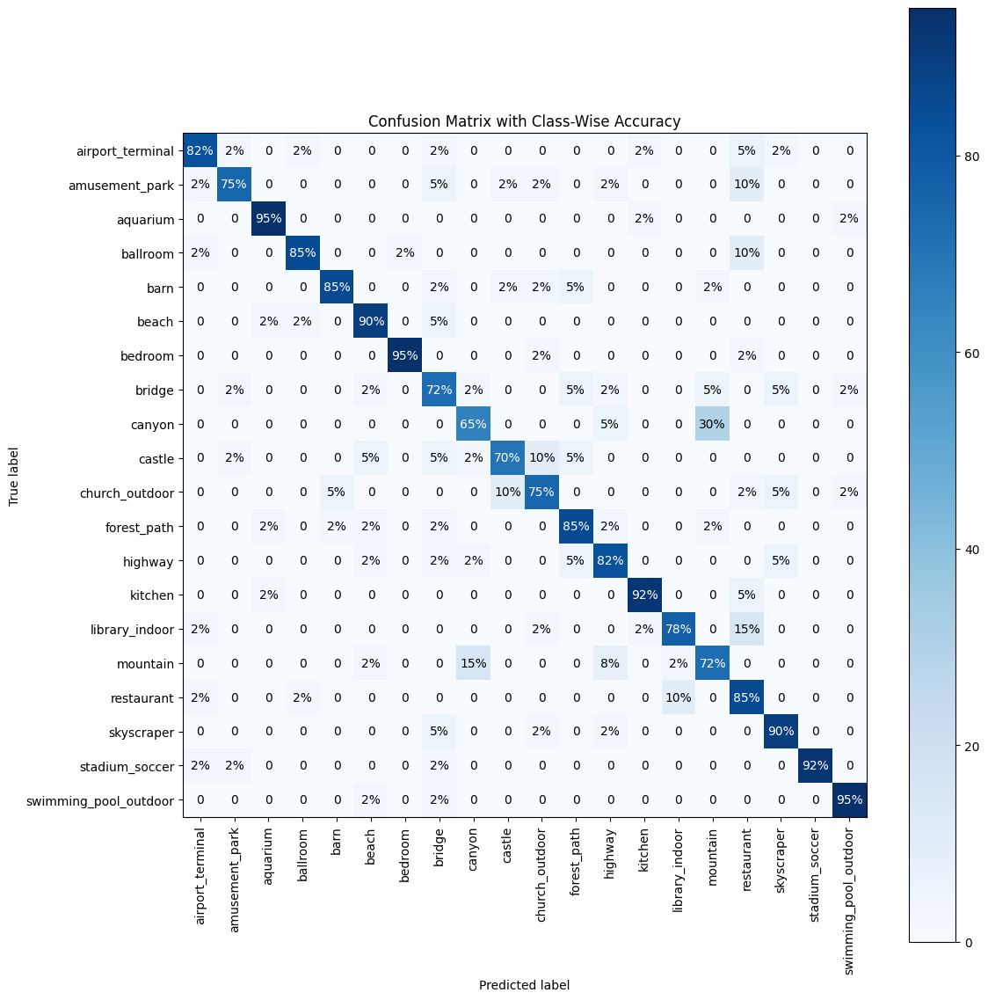

In [ ]:
fine_tuned_model.eval()

all_predictions = []
all_labels = []

# To evaluate on the test set
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)

        outputs = fine_tuned_model(images)
        _, predicted = torch.max(outputs.logits, 1)

        # Store predictions and labels
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_predictions = np.array(all_predictions)
all_labels = np.array(all_labels)

# Compute the confusion matrix
cm = confusion_matrix(all_labels, all_predictions)
class_names = test_loader.dataset.classes

cm_percentage = cm.astype(float) / cm.sum(axis=1, keepdims=True) * 100

annot = np.array([
    [f"{cm_percentage[i, j]:.0f}%" if cm[i, j] != 0 else "0" for j in range(len(class_names))]
    for i in range(len(class_names))
])

plt.figure(figsize=(12, 12))
plt.imshow(cm_percentage, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix with Class-Wise Accuracy")
plt.colorbar()

tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=90)
plt.yticks(tick_marks, class_names)

for i in range(len(class_names)):
    for j in range(len(class_names)):
        plt.text(j, i, annot[i, j],
                 ha='center', va='center',
                 color='white' if cm[i, j] > cm.max() / 2 else 'black')

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.tight_layout()
plt.show()

#### ***Attention maps***<br>
We use the test_dataset because we want to validate how the model generalizes its attention

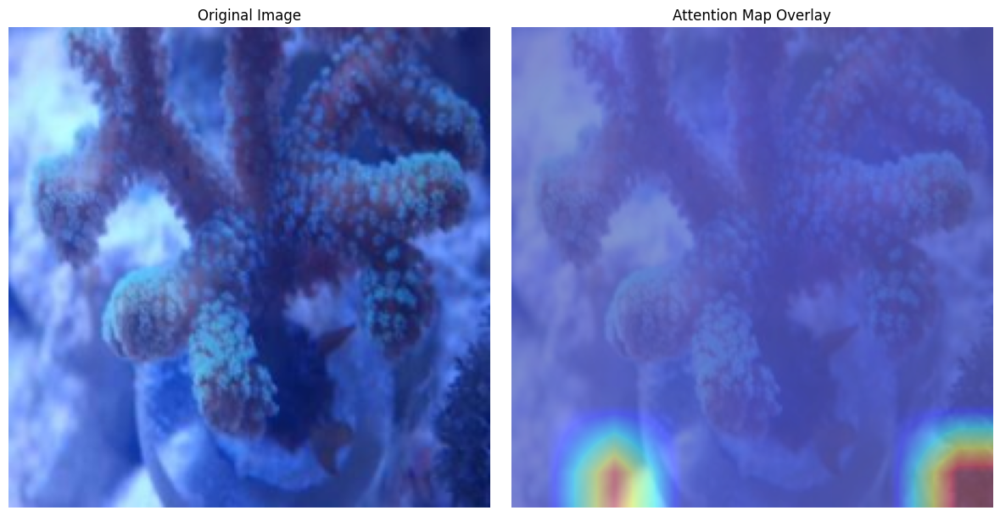

In [ ]:
import torch
import matplotlib.pyplot as plt
from torchvision.transforms import Normalize
import numpy as np

# Function to visualize attention maps using a fine-tuned model
def visualize_attention_after_finetuning(dataset, idx, fine_tuned_model, device, layer_idx=-1, head_idx=None):
    """
    Visualize the attention map for a specific image in the dataset.

    Parameters:
        dataset: The dataset containing the image (e.g., test_dataset).
        idx: Index of the image in the dataset.
        fine_tuned_model: The fine-tuned ViT model.
        device: The device (CPU/GPU) to run the model.
        layer_idx: The index of the transformer layer to visualize (default is the last layer).
        head_idx: The index of the attention head to visualize. If None, the max attention map is shown.
    """
    # Load and preprocess image from the dataset
    image, _ = dataset[idx]
    input_tensor = image.unsqueeze(0).to(device)

    # Ensure the model is in evaluation mode
    fine_tuned_model.eval()

    # Perform a forward pass to obtain attentions
    with torch.no_grad():
        outputs = fine_tuned_model(input_tensor, output_attentions=True)

    # Extract attention maps
    attentions = outputs.attentions  # List of attention maps for each layer
    attention = attentions[layer_idx][0]  # Shape: [num_heads, num_patches+1, num_patches+1]

    # Skip CLS token and focus on patch tokens
    attention = attention[:, 1:, 1:]  # Remove CLS token
    num_heads, num_patches = attention.shape[0], attention.shape[-1]

    # Select head: either max attention or specific head
    if head_idx is None:
        attention_map = attention.mean(0)  # Average over all heads
    else:
        attention_map = attention[head_idx]  # Single head attention map

    # Reshape attention to spatial dimensions
    grid_size = int(num_patches ** 0.5)
    attention_map = attention_map.mean(0)  # Average over queries
    attention_map = attention_map.reshape(grid_size, grid_size)

    # Upsample to image size
    attention_map = torch.nn.functional.interpolate(
        attention_map.unsqueeze(0).unsqueeze(0), size=(image.size(-2), image.size(-1)), mode="bilinear"
    )[0, 0].cpu().numpy()

    # Normalize attention map
    attention_map = (attention_map - attention_map.min()) / (attention_map.max() - attention_map.min())

    # Unnormalize the image for visualization
    unnormalize = Normalize(
        mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
        std=[1 / 0.229, 1 / 0.224, 1 / 0.225],
    )
    original_image = unnormalize(image).clamp(0, 1).permute(1, 2, 0).cpu().numpy()

    # Overlay the attention map on the image
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    ax[0].imshow(original_image)
    ax[0].axis("off")
    ax[0].set_title("Original Image")

    ax[1].imshow(original_image, alpha=0.6)
    ax[1].imshow(attention_map, cmap="jet", alpha=0.4)
    ax[1].axis("off")
    ax[1].set_title("Attention Map Overlay")

    plt.tight_layout()
    plt.show()


# Example: Visualize an image from the test_dataset
idx = 90  # Change the index to visualize different images
visualize_attention_after_finetuning(test_dataset, idx, fine_tuned_model=fine_tuned_model, device=device, head_idx= None)


To inspect the heads and see what they "give attention" to in the image

Visualizing head 0


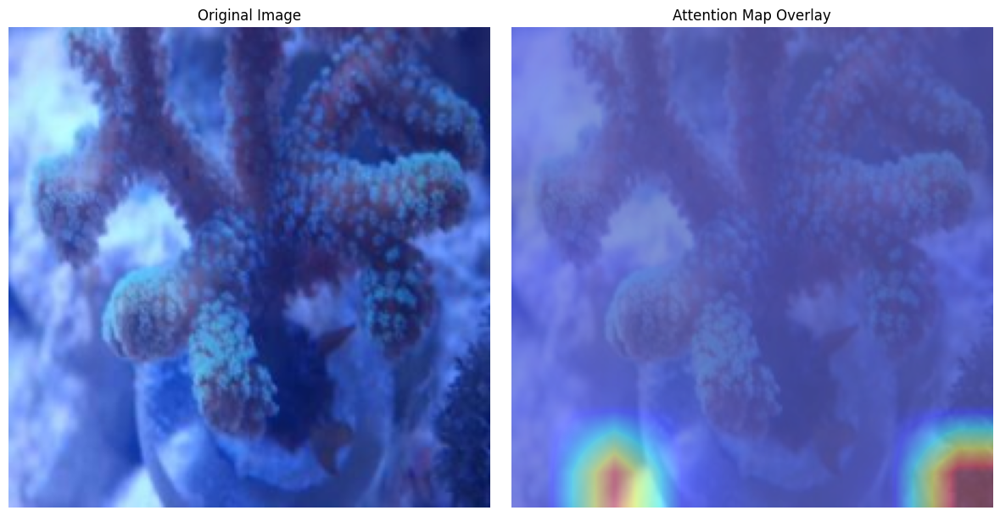

Visualizing head 1


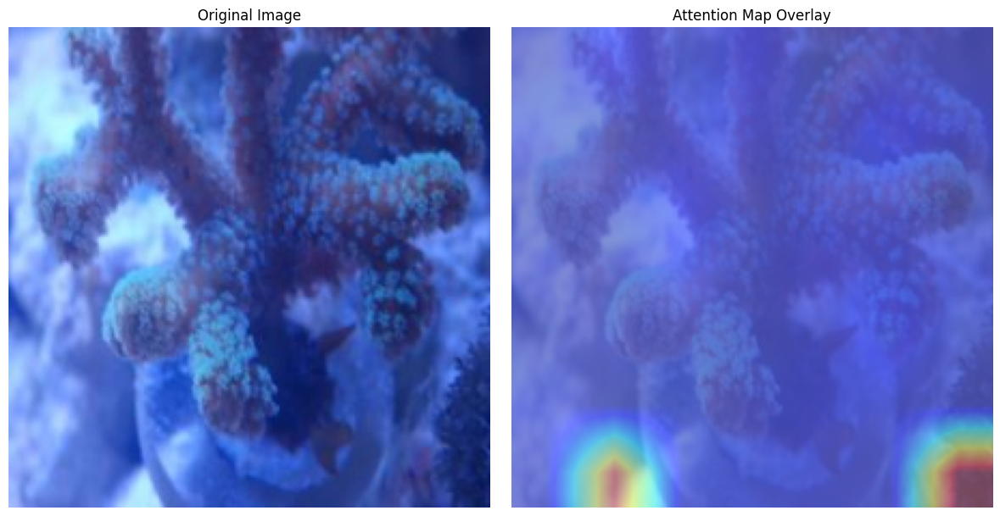

Visualizing head 2


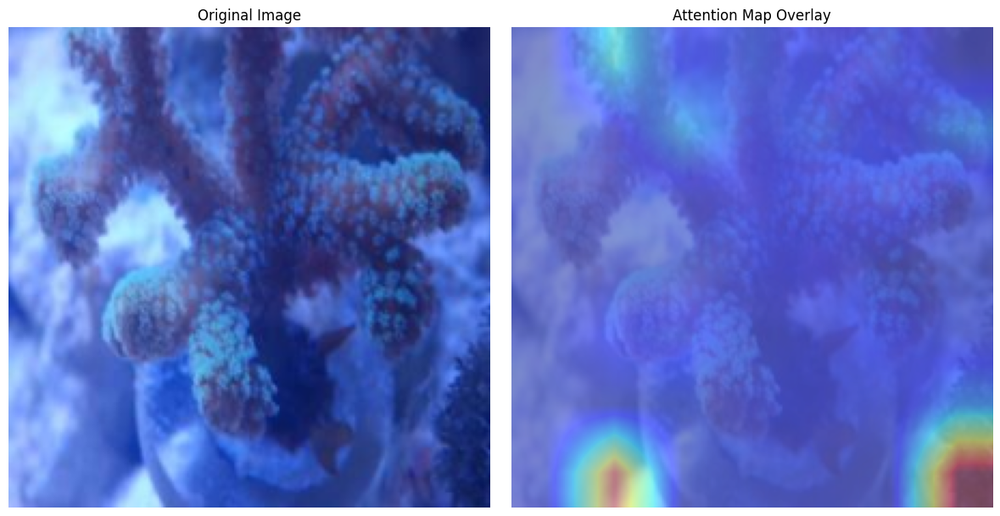

Visualizing head 3


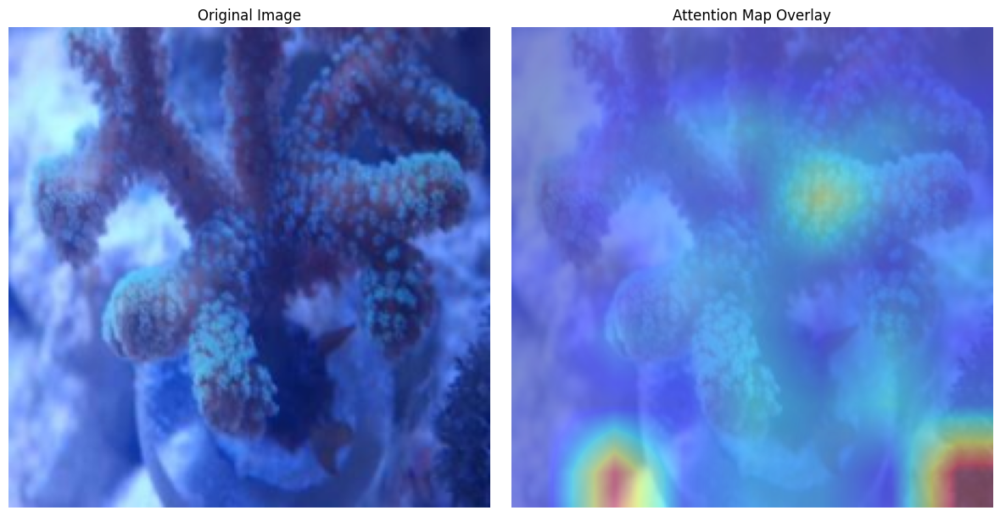

Visualizing head 4


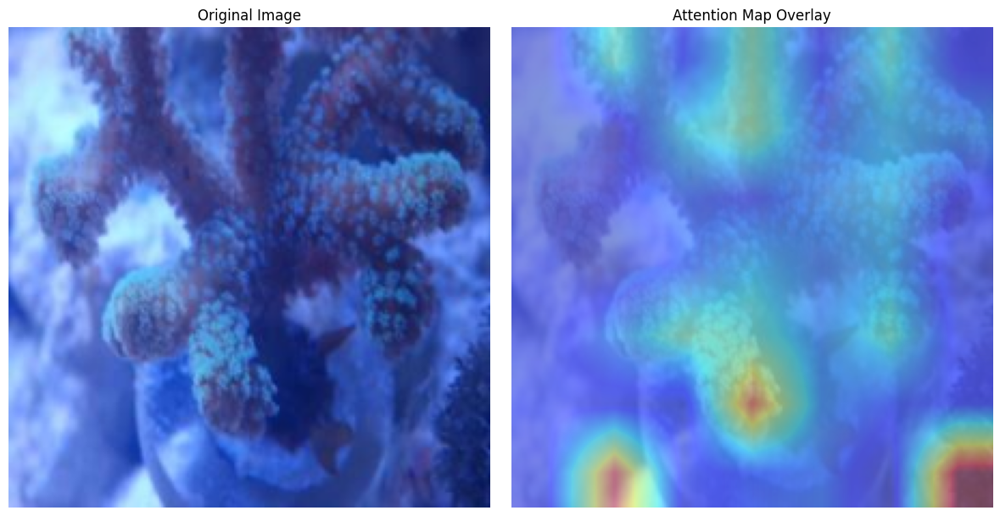

Visualizing head 5


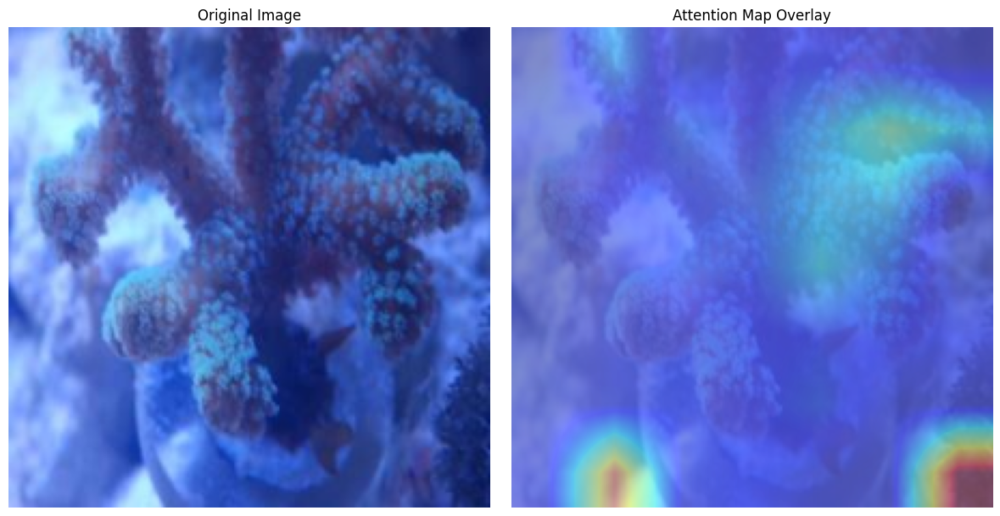

Visualizing head 6


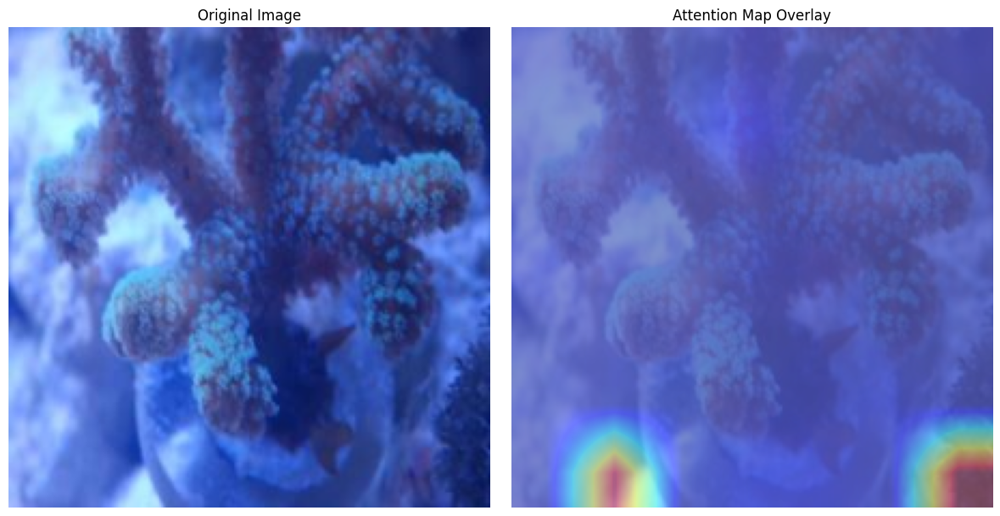

Visualizing head 7


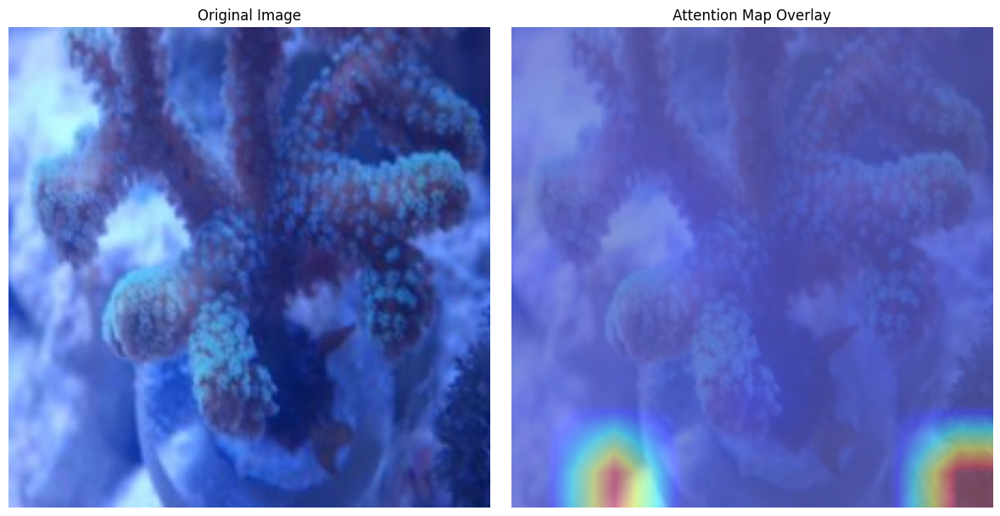

Visualizing head 8


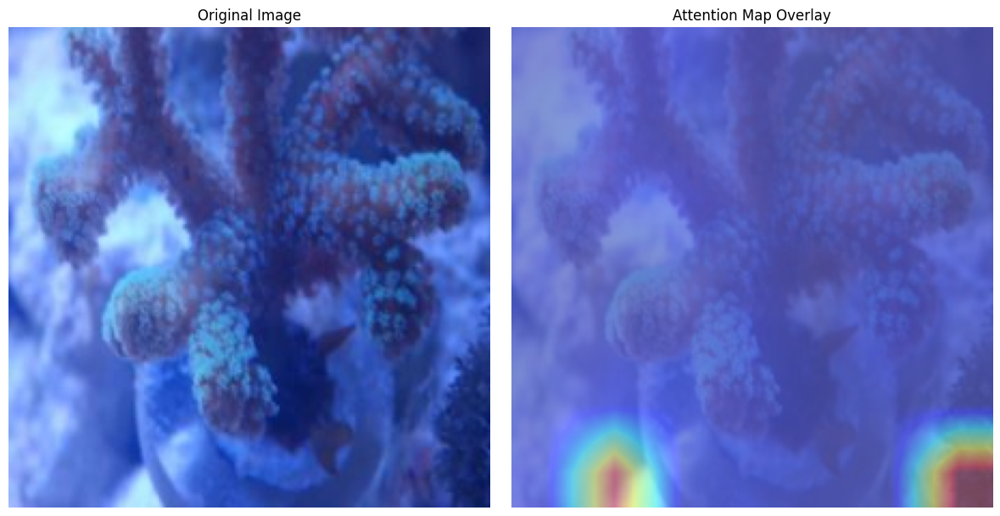

Visualizing head 9


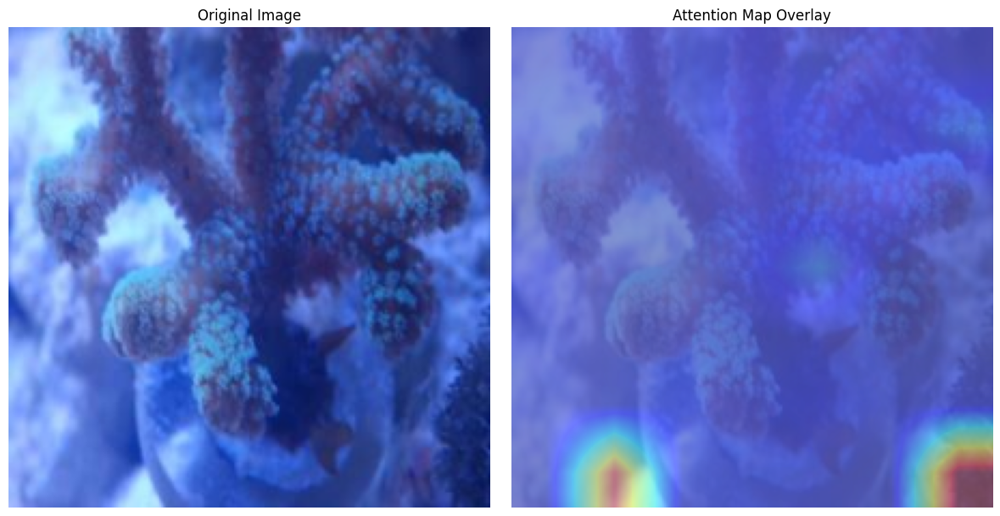

Visualizing head 10


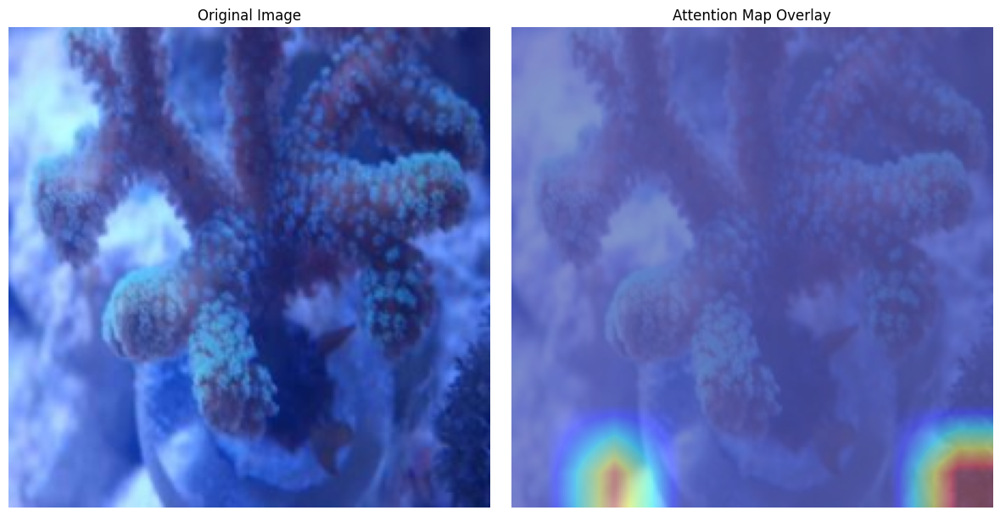

Visualizing head 11


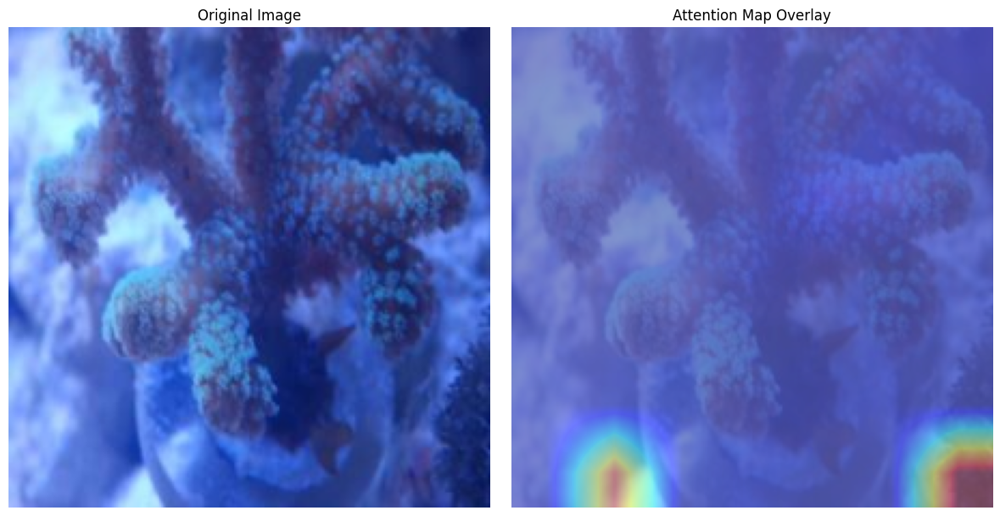

In [ ]:
for head_idx in range(12):  # Assuming 12 heads
    print(f"Visualizing head {head_idx}")
    visualize_attention_after_finetuning(test_dataset, idx, fine_tuned_model=fine_tuned_model, device=device, head_idx=head_idx)

So we can maybe try a ranking system to see which head contributes the most to the attention in the image and which one are just redundant:

In [ ]:
import torch
import numpy as np

def rank_attention_heads(attentions, method="variance"):
    """
    Rank attention heads based on a chosen method (e.g., variance, entropy).

    Parameters:
        attentions: Tensor of attention maps for all heads [num_heads, num_patches, num_patches].
        method: Method to rank heads ('variance' or 'entropy').

    Returns:
        A list of (head_idx, score) sorted by importance.
    """
    scores = []
    for head_idx in range(attentions.shape[0]):
        attention_map = attentions[head_idx]

        if method == "variance":
            score = attention_map.var().item()  # Compute variance across patches
        elif method == "entropy":
            prob = attention_map / attention_map.sum(dim=-1, keepdim=True)  # Normalize to probabilities
            entropy = -(prob * torch.log(prob + 1e-8)).sum(dim=-1).mean().item()
            score = -entropy  # Lower entropy means higher focus

        scores.append((head_idx, score))

    # Sort heads by score in descending order
    scores.sort(key=lambda x: x[1], reverse=True)
    return scores

# Example Usage: Load image, preprocess it, and rank attention heads
def rank_heads_for_image(dataset, idx, model, device, layer_idx=-1, method="variance"):
    """
    Load an image from the dataset, compute attention maps, and rank heads.
    """
    # Load and preprocess image
    image, _ = dataset[idx]
    input_tensor = image.unsqueeze(0).to(device)

    # Ensure model is in evaluation mode
    model.eval()

    # Compute attention maps
    with torch.no_grad():
        outputs = model(input_tensor, output_attentions=True)
        attentions = outputs.attentions[layer_idx][0, :, 1:, 1:]  # Extract attention maps (skip CLS token)

    # Rank heads
    ranked_heads = rank_attention_heads(attentions, method=method)

    # Print rankings
    print(f"Attention Head Rankings (by {method.capitalize()}):")
    for head_idx, score in ranked_heads:
        print(f"Head {head_idx}: Score = {score:.4f}")

    return ranked_heads

# Parameters
idx = 90  # Image index
layer_idx = -1  # Use the last layer
method = "variance"  # 'variance' or 'entropy' # almost teh same ranking whether it's entropy or variance

# Call the function
rank_heads_for_image(test_dataset, idx, model, device, layer_idx, method)

Attention Head Rankings (by Variance):
Head 10: Score = 0.0078
Head 11: Score = 0.0035
Head 0: Score = 0.0032
Head 6: Score = 0.0028
Head 7: Score = 0.0024
Head 8: Score = 0.0017
Head 9: Score = 0.0014
Head 2: Score = 0.0011
Head 1: Score = 0.0011
Head 5: Score = 0.0005
Head 4: Score = 0.0004
Head 3: Score = 0.0004


[(10, 0.007760383188724518),
 (11, 0.0035479303915053606),
 (0, 0.00316235632635653),
 (6, 0.0027556954883038998),
 (7, 0.0023663416504859924),
 (8, 0.0016970237484201789),
 (9, 0.001357566798105836),
 (2, 0.001142112072557211),
 (1, 0.0011154847452417016),
 (5, 0.0004970646114088595),
 (4, 0.000408333056839183),
 (3, 0.000387937412597239)]

Given this results we can see  that Head 10 and Head 11 have the highest variance scores, while Head 4 and Head 3 have the lowest.

What Does This Mean?<br>
High Variance Heads (e.g., Head 10, Head 11):<br>

These heads have more focused attention, meaning they distribute their attention selectively across specific regions (e.g., objects, structures).
Higher variance indicates that the head is likely capturing important features or regions in the image.<br>

Low Variance Heads (e.g., Head 4, Head 3):<br>

These heads have more uniform or scattered attention, spreading their focus evenly across the image.<br>
Heads with very low variance often focus less on specific features and might contribute less useful information.

So what can be done is to try to visualize attention at different layers:<br>
- Early layers focus on low-level features (edges, textures).<br>
- Later layers focus on high-level semantics (object boundaries).<br>

#### ***Attention maps for missclassified classes***

After evaluating the models using class-wise accuracy and the confusion matrix to quantify their performance, and after experimenting a bit with the attentions maps, we further analyzed their behavior by generating attention maps with a particular focus on misclassified images. These maps provide visual insights into the regions of the input that the model focused on while making predictions, allowing us to better understand potential sources of misclassification. By highlighting the most relevant areas of an image for each class, attention maps enhance interpretability and help identify whether the model's focus aligns with meaningful features or distracts towards irrelevant areas. This qualitative analysis offers a complementary perspective to the quantitative evaluation metrics, shedding light on the model’s decision-making process.

We focused on identifying and analyzing misclassified images, particularly for the class pairs 'church_outdoor' and 'castle' as well as 'canyon' and 'mountain,' since these were the most frequently misclassified categories by the model, as it can be seen from the metrics from the previous section.

So, first we implemented a method to identify and analyze misclassified images by mapping their predicted and true labels to class names:

In [ ]:
label_mapping = {
    0: "airport_terminal",
    1: "amusement_park",
    2: "aquarium",
    3: "ballroom",
    4: "barn",
    5: "beach",
    6: "bedroom",
    7: "bridge",
    8: "canyon",
    9: "castle",
    10: "church_outdoor",
    15: "mountain"
}

def get_misclassified_images(dataset, model, device, label_mapping):
    """
    Get the misclassified images and their indices from a dataset.

    Parameters:
        dataset: The dataset containing the images.
        model: The fine-tuned ViT model.
        device: The device (CPU/GPU) to run the model.
        label_mapping: A dictionary mapping label indices to class names.

    Returns:
        misclassified: A list of tuples containing (image, true_label, predicted_label, index).
    """
    misclassified = []

    model.eval()

    # Iterate through the dataset
    for idx, (image, label) in enumerate(dataset):

        input_tensor = image.unsqueeze(0).to(device)

        # Perform prediction
        with torch.no_grad():
            outputs = model(input_tensor)
            predicted_label = torch.argmax(outputs, dim=1).item()

        if label in label_mapping and predicted_label in label_mapping:
            true_label_name = label_mapping[label]
            pred_label_name = label_mapping[predicted_label]
        else:
            continue

        # Check for misclassification
        if label != predicted_label:
            misclassified.append((image, true_label_name, pred_label_name, idx))

    return misclassified

# Labels of interest
labels_to_find = [8, 15]

misclassified_images = get_misclassified_images(test_dataset, model, device, label_mapping)

filtered_misclassified = [
    (img, true_label, pred_label, idx)
    for img, true_label, pred_label, idx in misclassified_images
    if any(true_label == label_mapping[label] for label in labels_to_find)
]

print(f"Found {len(filtered_misclassified)} misclassified images for 'castle' and 'church_outdoor'.")

for img, true_label, pred_label, idx in filtered_misclassified:
    print(f"Index: {idx}, True Label: {true_label}, Predicted Label: {pred_label}")

    pil_image = ToPILImage()(img)
    pil_image.show()

And then we printed the corresponding attention map to visualize the regions of the image that the model focused on during its prediction, highlighting the aggregated attention across multiple heads and layers for better interpretability:

In [ ]:
def get_attention_maps(module, input, output):
    """Hook function to extract attention maps."""
    global attention_maps
    attention_maps.append(output)

def visualize_aggregated_attention(dataset, idx, fine_tuned_model, device, layer_idx=5, head_range=(0, 11)):
    """
    Visualize the aggregated attention map across a range of heads for a specific layer.

    Parameters:
        dataset: The dataset containing the image (e.g., test_dataset).
        idx: Index of the image in the dataset.
        fine_tuned_model: The fine-tuned ViT model.
        device: The device (CPU/GPU) to run the model.
        layer_idx: The index of the transformer layer to visualize (default is 5).
        head_range: Tuple specifying the range of heads to aggregate (inclusive).

    Returns:
        None: Displays the original image and the aggregated attention map.
    """
    # Load and preprocess the image
    image, _ = dataset[idx]
    input_tensor = image.unsqueeze(0).to(device)

    # Ensure the model is in evaluation mode
    fine_tuned_model.eval()

    # Perform a forward pass with attention outputs
    with torch.no_grad():
        outputs = fine_tuned_model(input_tensor, output_attentions=True)

    # Extract attention maps for the given layer
    attentions = outputs.attentions  # List of attention maps per layer
    attention = attentions[layer_idx][0]  # Shape: [num_heads, num_patches+1, num_patches+1]

    # Skip CLS token and focus on patch tokens
    attention = attention[:, 1:, 1:]

    # Aggregate attention across the specified head range
    attention_map = attention[head_range[0]:head_range[1] + 1].mean(0).mean(0)  # Average over specified heads and queries

    # Reshape to spatial grid
    grid_size = int(attention_map.size(0) ** 0.5)
    attention_map = attention_map.reshape(grid_size, grid_size)

    # Upsample to match image size
    attention_map = torch.nn.functional.interpolate(
        attention_map.unsqueeze(0).unsqueeze(0),
        size=(image.size(-2), image.size(-1)),
        mode="bilinear"
    )[0, 0].cpu().numpy()

    # Normalize attention map
    attention_map = (attention_map - attention_map.min()) / (attention_map.max() - attention_map.min())

    # Unnormalize the image for visualization
    unnormalize = Normalize(
        mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
        std=[1 / 0.229, 1 / 0.224, 1 / 0.225],
    )
    original_image = unnormalize(image).clamp(0, 1).permute(1, 2, 0).cpu().numpy()

    # Visualize the original image and aggregated attention map
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    ax[0].imshow(original_image)
    ax[0].axis("off")
    ax[0].set_title("Original Image")

    ax[1].imshow(original_image, alpha=0.6)
    ax[1].imshow(attention_map, cmap="jet", alpha=0.4)
    ax[1].axis("off")
    ax[1].set_title(f"Aggregated Attention Map (Layer {layer_idx}, Heads {head_range[0]}-{head_range[1]})")

    plt.tight_layout()
    plt.show()


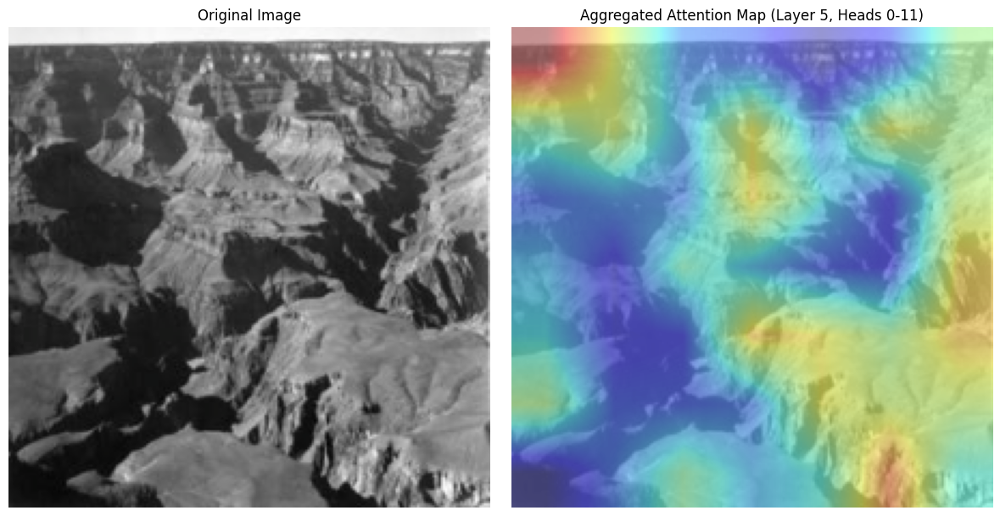

In [ ]:
idx = 359  # Image index
visualize_aggregated_attention(test_dataset, idx=idx, fine_tuned_model=fine_tuned_model, device=device, layer_idx=5, head_range=(0, 11))

A Vision Transformer (ViT) consists of stacked layers—12 layers in the case of ViT-B/32—that progressively process input embeddings, combining patch-level features into increasingly abstract and global representations. Each layer plays a distinct role in image recognition. Early layers focus on low-level features such as edges, colors, and textures, with attention spreading widely across the image to capture local details. As the processing moves to middle layers, the model begins to combine these low-level features into object-level representations. At this stage, attention maps become more focused on meaningful structures in the image, such as outlines and boundaries, providing the most interpretable visualizations. Layer 5, for instance, represents a balance between local and global focus, where attention highlights object structures while retaining spatial details. Deeper layers, however, transition towards high-level semantic understanding. Here, attention becomes global and task-specific, concentrating on smaller but highly significant regions, such as object centers or features critical for the final prediction. Attention in a ViT thus evolves across layers: early layers produce local and scattered attention, middle layers achieve a balanced local-global focus ideal for visualization, and deeper layers focus on abstract, task-driven features that are less visually interpretable. This progression makes middle layers like Layer 5 particularly suitable for attention visualization, as they reveal object boundaries and semantic regions effectively, while deeper layers prioritize predictive accuracy at the expense of spatial detail.